In [2]:
# Mount GoogleDrive
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
!pip install fastai==2.0.19
!pip install fastai2==0.0.30
!pip install fastcore==1.3.1
!pip install -Uqq fastbook

In [4]:
# Import modules
import fastbook
from fastbook import *
fastbook.setup_book()
from fastai.vision.widgets import *

import warnings
warnings.filterwarnings("ignore")

import requests
import matplotlib.pyplot as plt
import PIL.Image
from io import BytesIO
import os

from IPython.display import Image
from IPython.core.display import HTML

Mounted at /content/gdrive


In [5]:
# Create path to store the images
try:
  os.mkdir('images')
except:
  pass

In [6]:
api_key = 'XXX'
search_url = 'https://api.bing.microsoft.com/v7.0/images/search'
headers = {"Ocp-Apim-Subscription-Key": api_key}

In [7]:
search_term = "cheetah"
count = 150 # Number of returning search results
params = {'q': search_term, 'license': 'public', 'imageType': 'photo', 'count': count}

response = requests.get(search_url, headers=headers, params=params)
response.raise_for_status()

# Return JSon file
search_results = response.json()

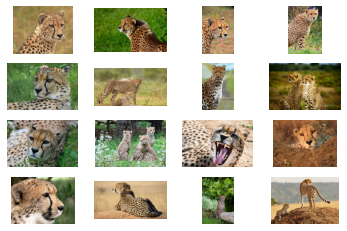

In [8]:
# Create thumbnails
thumbnail_url = [img['thumbnailUrl'] for img in search_results['value'][:16]]

# Displaying thumbnails
f, axes = plt.subplots(4, 4)
for i in range(4):
  for j in range(4):
    image_data = requests.get(thumbnail_url[i+4*j])
    image_data.raise_for_status()
    image = PIL.Image.open(BytesIO(image_data.content))
    axes[i][j].imshow(image)
    axes[i][j].axis('off')

plt.show()

In [9]:
img_url = [img['contentUrl'] for img in search_results['value']]
len(img_url)

150

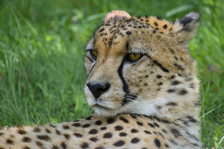

In [11]:
img_url[1]
dest = 'images/test.jpg'
download_url(img_url[1], dest)
             
img = PIL.Image.open(dest)
img.to_thumb(224,224)

In [12]:
# Downloading images
animals = ['cheetah', 'jaguar', 'leopard']
path = Path('animals')

if not path.exists():
  path.mkdir()
  for animal_type in animals:
    dest = (path/animal_type)
    dest.mkdir(exist_ok=True)

    search_term = animal_type
    params = {'q': search_term, 'license': 'public', 'imageType': 'photo', 'count': '150'}
    response = requests.get(search_url, headers=headers, params=params)
    response.raise_for_status()
    search_results = response.json()
    img_url = [img['contentUrl'] for img in search_results['value']]

    # Download images
    download_images(dest, urls=img_url)

In [13]:
img_files = get_image_files(path)
img_files

(#323) [Path('animals/leopard/00000097.jpg'),Path('animals/leopard/00000040.jpg'),Path('animals/leopard/00000052.jpg'),Path('animals/leopard/00000003.jpg'),Path('animals/leopard/00000099.jpg'),Path('animals/leopard/00000053.jpg'),Path('animals/leopard/00000015.jpg'),Path('animals/leopard/00000014.jpg'),Path('animals/leopard/00000000.jpg'),Path('animals/leopard/00000047.jpg')...]

In [14]:
# Verify if the images are corrupt
failed = verify_images(img_files)
failed

(#48) [Path('animals/leopard/00000052.jpg'),Path('animals/leopard/00000000.jpg'),Path('animals/leopard/00000032.jpg'),Path('animals/leopard/00000115.jpg'),Path('animals/leopard/00000011.jpg'),Path('animals/leopard/00000020.jpg'),Path('animals/leopard/00000010.jpg'),Path('animals/leopard/00000031.jpg'),Path('animals/leopard/00000062.jpg'),Path('animals/leopard/00000064.jpg')...]

In [15]:
# Remove corrupt images
failed.map(Path.unlink)

(#48) [None,None,None,None,None,None,None,None,None,None...]

In [16]:
animal_data_block = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128)
)

In [17]:
dls = animal_data_block.dataloaders(path)

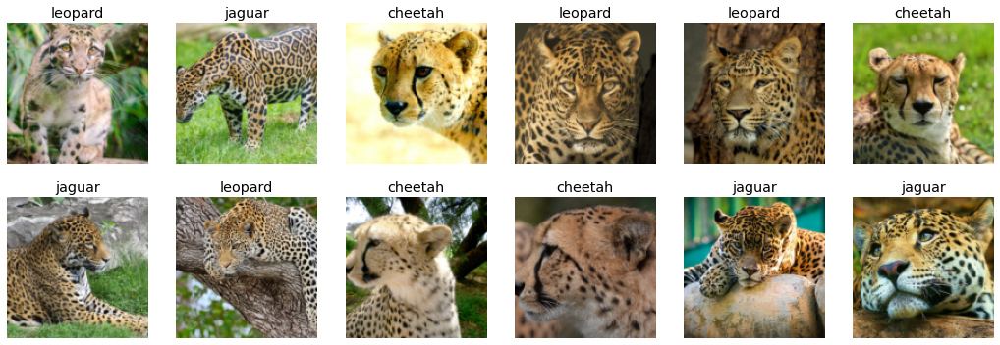

In [18]:
# validating the data
dls.valid.show_batch(max_n=12, nrows=2)

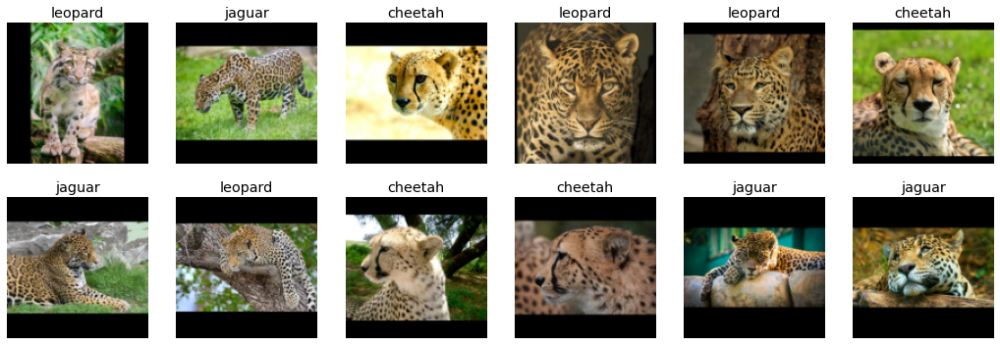

In [19]:
animal_data_block = animal_data_block.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = animal_data_block.dataloaders(path)
dls.valid.show_batch(max_n=12, nrows=2)

In [20]:
animal_data_block = animal_data_block.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = animal_data_block.dataloaders(path)

In [21]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.958515,1.107352,0.436364,00:09


epoch,train_loss,valid_loss,error_rate,time
0,1.119857,0.691130,0.236364,00:09
1,0.987888,0.484360,0.127273,00:09
2,0.803569,0.466551,0.127273,00:09
3,0.723542,0.460774,0.127273,00:09


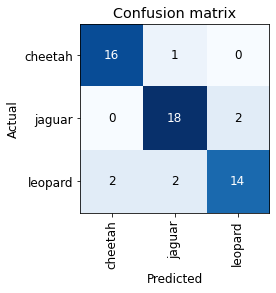

In [22]:
# Confusion Matrix
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

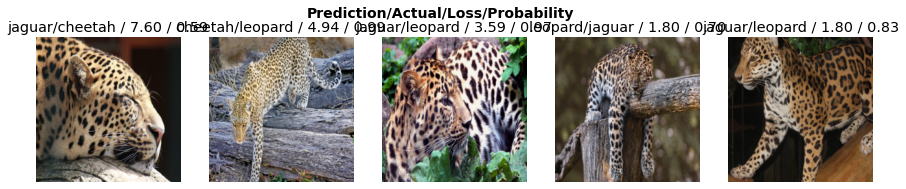

In [23]:
# top losses
interp.plot_top_losses(5, nrows=1)

In [24]:
# Cleaning the data
cleaner = ImageClassifierCleaner(learn)
cleaner

In [25]:
# Delete images marked as delete
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
    
# Update category of image to the newly specified category by moving # it into the appropriate folder
for idx,cat in cleaner.change(): shutil.copyfile(cleaner.fns[idx], path/cat)

In [26]:
dls = animal_data_block.dataloaders(path)
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.991999,1.629157,0.600000,00:09


epoch,train_loss,valid_loss,error_rate,time
0,1.152487,0.942652,0.309091,00:09
1,0.925184,0.616632,0.236364,00:09
2,0.789309,0.566271,0.200000,00:09
3,0.702300,0.544979,0.218182,00:09


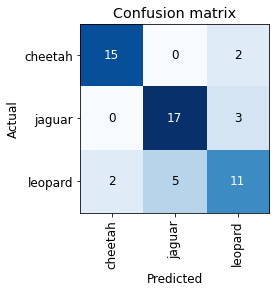

In [27]:
interpretation = ClassificationInterpretation.from_learner(learn)
interpretation.plot_confusion_matrix()

In [28]:
# Saving and exporting the model

learn.export()
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [29]:
# Loading the model
learn_inf = load_learner(path/'export.pkl')

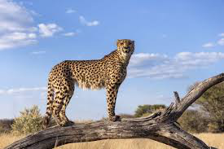

In [31]:
# Testing the model with a sample image
sample_img = ['https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTF2gu2qbOycKiy_aQArKsTTNaJffWLjqlhZQ&usqp=CAU']
dest = 'images/test_image_cheetah.jpg'
download_url(sample_img[0], dest)

im = PIL.Image.open(dest)
im.to_thumb(224,224)

In [32]:
learn_inf.predict('images/test_image_cheetah.jpg')

('cheetah', tensor(0), tensor([9.9928e-01, 8.9999e-06, 7.1412e-04]))

In [33]:
learn_inf.dls.vocab

['cheetah', 'jaguar', 'leopard']

In [34]:
# Deployment of the model
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [ ]:
# Retrieving the uploaded image
img = PIL.Image.create(btn_upload.data[-1])

In [ ]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(224,224))
out_pl

In [ ]:
pred,pred_idx,probs = learn_inf.predict(img)

In [ ]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

In [ ]:
btn_run = widgets.Button(description='Classify Image')
btn_run

In [ ]:
def on_click_classify(change):
    img = PIL.Image.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [ ]:
VBox([widgets.Label('Upload an image to classify'), 
      btn_upload, btn_run, out_pl, lbl_pred])